## Covid-19: Análisis del progreso de la vacunación mundial

In [1]:
#!pip install a-world-of-countries

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pylab
import scipy.stats as ss
import csv
import awoc
import numpy as np
import sklearn
from sklearn import datasets

import pandas_profiling as pp

#### Variables


1. **Country:** es el país para el que se proporciona la información sobre la vacunación;
2. **Country ISO Code** - código ISO del país;
3. **Fecha** - fecha para la entrada de datos; para algunas de las fechas tenemos sólo las vacunas diarias, para otras, sólo el total (acumulado);
3. **Total number of vaccinations** - es el número absoluto de vacunas totales en el país;
4. **Total number of people vaccinated** - una persona, dependiendo del esquema de vacunación, recibirá una o más (normalmente 2) vacunas; en un momento dado, el número de vacunaciones puede ser mayor que el número de personas;
5. **Número total de personas totalmente vacunadas** - es el número de personas que recibieron todo el conjunto de vacunas según el esquema de inmunización (típicamente 2); en un momento determinado, puede haber un cierto número de personas que recibieron una vacuna y otro número (menor) de personas que recibieron todas las vacunas del esquema;
6. **Daily vaccinations (raw):** para una determinada entrada de datos, el número de vacunaciones para esa fecha/país;
7. **Daily vaccinations:** para una determinada entrada de datos, el número de vacunaciones para esa fecha/país;
8. **Total vaccinations per hundred** - relación (en porcentaje) entre el número de vacunaciones y la población total hasta la fecha en el país;
9. **Total number of people vaccinated per hundred**  - relación (en porcentaje) entre la población vacunada y la población total hasta la fecha en el país;
10. **Total number of people fully vaccinated per hundred** - relación (en porcentaje) entre la población totalmente vacunada y la población total hasta la fecha en el país;
11. **Number of vaccinations per day** - número de vacunaciones diarias para ese día y país;
    Daily vaccinations per million  - relación (en ppm) entre el número de vacunaciones y la población total para la fecha en el país;
12. **Vaccines used in the country** - número total de vacunas utilizadas en el país (hasta la fecha);
13. **Source name** - fuente de la información (autoridad nacional, organización internacional, organización local, etc.);
14. **Source website**  - sitio web de la fuente de información.


In [3]:
#from google.colab import drive
#drive.mount('/content/drive', force_remount=True)

In [4]:
#df = pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv',sep=',')

In [5]:
df = pd.read_csv("country_vaccinations.csv")
df2 = pd.read_csv("covid19_country_population.csv")

In [6]:
#getting a profile summary
pp.ProfileReport(df)

In [7]:
df2 = df2.rename(columns={'CountryAlpha3Code': 'iso_code'})

Eliminamos la columna daily_vaccinations_raw, ya que es una versión "a sucio" de daily_vaccinations

In [8]:
df = df.drop('daily_vaccinations_raw', axis=1)

Ponemos la fecha en nuestro formato y ordenamos los datos por fechas de vacunación (de la más antigua a la más actual)

In [9]:
df.dtypes

country                                 object
iso_code                                object
date                                    object
total_vaccinations                     float64
people_vaccinated                      float64
people_fully_vaccinated                float64
daily_vaccinations                     float64
total_vaccinations_per_hundred         float64
people_vaccinated_per_hundred          float64
people_fully_vaccinated_per_hundred    float64
daily_vaccinations_per_million         float64
vaccines                                object
source_name                             object
source_website                          object
dtype: object

In [10]:
df['date'] = pd.to_datetime(df['date'])
#df = df.sort_values('date', ascending=True)

df['date'] = df['date'].dt.strftime('%Y-%m-%d')


In [11]:
df[['date']] = df[['date']].apply(pd.to_datetime)

In [12]:
df.dtypes

country                                        object
iso_code                                       object
date                                   datetime64[ns]
total_vaccinations                            float64
people_vaccinated                             float64
people_fully_vaccinated                       float64
daily_vaccinations                            float64
total_vaccinations_per_hundred                float64
people_vaccinated_per_hundred                 float64
people_fully_vaccinated_per_hundred           float64
daily_vaccinations_per_million                float64
vaccines                                       object
source_name                                    object
source_website                                 object
dtype: object

In [13]:
# Combining the two datasets using pd.join, ensuring that three common columns are used as the index.

#df_1 = df.set_index(['iso_code', 'date'])
df_1 = df.set_index('iso_code')
df_2 = df2.set_index('iso_code')
covid_vaccine_data = df_1.join(df_2)
covid_vaccine_data

,country,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website,Population
iso_code,,,,,,,,,,,,,,
ABW,Aruba,2021-04-20,43945.0,27511.0,16434.0,NaN,41.16,25.77,15.39,NaN,Pfizer/BioNTech,Government of Aruba,https://www.government.aw,106314.0
AFG,Afghanistan,2021-02-22,0.0,0.0,NaN,NaN,0.00,0.00,NaN,NaN,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...,38041754.0
AFG,Afghanistan,2021-02-23,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...,38041754.0
AFG,Afghanistan,2021-02-24,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...,38041754.0
AFG,Afghanistan,2021-02-25,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,Oxford/AstraZeneca,Government of Afghanistan,http://www.xinhuanet.com/english/asiapacific/2...,38041754.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZWE,Zimbabwe,2021-04-15,285881.0,252932.0,32949.0,13172.0,1.92,1.70,0.22,886.0,Sinopharm/Beijing,Ministry of Health,https://twitter.com/MoHCCZim/status/1384225499...,14645468.0
ZWE,Zimbabwe,2021-04-16,304701.0,269732.0,34969.0,14071.0,2.05,1.81,0.24,947.0,Sinopharm/Beijing,Ministry of Health,https://twitter.com/MoHCCZim/status/1384225499...,14645468.0
ZWE,Zimbabwe,2021-04-17,311901.0,276095.0,35806.0,12738.0,2.10,1.86,0.24,857.0,Sinopharm/Beijing,Ministry of Health,https://twitter.com/MoHCCZim/status/1384225499...,14645468.0


Con unique_dates podemos saber que días se ha vacunado (teniendo en cuenta todos los países)

In [14]:
covid_vaccine_data['vaccines'].unique()

array(['Pfizer/BioNTech', 'Oxford/AstraZeneca',
       'Pfizer/BioNTech, Sinovac', 'Oxford/AstraZeneca, Pfizer/BioNTech',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sinopharm/Wuhan, Sputnik V',
       'Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V', 'Sputnik V',
       'Moderna, Oxford/AstraZeneca, Pfizer/BioNTech', 'Sinovac',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sputnik V',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, Sputnik V',
       'Oxford/AstraZeneca, Sinovac', 'Moderna, Pfizer/BioNTech',
       'Sinopharm/Beijing, Sinopharm/Wuhan, Sinovac', 'Sinopharm/Beijing',
       'Sinopharm/Beijing, Sputnik V',
       'Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac',
       'Oxford/AstraZeneca, Sinopharm/Beijing',
       'Moderna, Oxford/AstraZeneca',
       'Moderna, Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sputnik V',
       'Covaxin, Oxford/AstraZeneca',
       'Pfizer/BioNTech, Sinopharm/Beijing',
       'Oxford/A

In [15]:
unique_dates = df['date'].unique()
#unique_dates = covid_vaccine_data['date'].unique()
type(unique_dates[0])

numpy.datetime64

In [16]:
covid_vaccine_data.sort_values(by = 'date')

,country,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website,Population
iso_code,,,,,,,,,,,,,,
CAN,Canada,2020-12-14,5.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",Official data from provinces via covid19tracke...,https://covid19tracker.ca/vaccinationtracker.html,3.758926e+07
CHN,China,2020-12-15,1500000.0,NaN,NaN,NaN,0.10,NaN,NaN,NaN,"Sinopharm/Beijing, Sinopharm/Wuhan, Sinovac",National Health Commission,http://www.nhc.gov.cn/xcs/yqjzqk/202104/aa7229...,1.397715e+09
RUS,Russia,2020-12-15,28500.0,28500.0,NaN,NaN,0.02,0.02,NaN,NaN,"EpiVacCorona, Sputnik V",Official data from local governments via gogov.ru,https://gogov.ru/articles/covid-v-stats,1.443735e+08
CAN,Canada,2020-12-15,723.0,NaN,NaN,718.0,0.00,NaN,NaN,19.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",Official data from provinces via covid19tracke...,https://covid19tracker.ca/vaccinationtracker.html,3.758926e+07
CHN,China,2020-12-16,NaN,NaN,NaN,187500.0,NaN,NaN,NaN,130.0,"Sinopharm/Beijing, Sinopharm/Wuhan, Sinovac",National Health Commission,http://www.nhc.gov.cn/xcs/yqjzqk/202104/aa7229...,1.397715e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VNM,Vietnam,2021-04-20,106929.0,106929.0,NaN,6684.0,0.11,0.11,NaN,69.0,Oxford/AstraZeneca,Government of Vietnam,https://vnexpress.net/sang-21-4-khong-ca-nhiem...,9.646211e+07
GRC,Greece,2021-04-20,2600998.0,1826618.0,774380.0,45723.0,24.95,17.52,7.43,4387.0,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",Ministry of Health,https://www.data.gov.gr/datasets/mdg_emvolio/,1.071632e+07
GRL,Greenland,2021-04-20,11508.0,7210.0,4298.0,216.0,20.27,12.70,7.57,3805.0,Pfizer/BioNTech,Government of Greenland,https://corona.nun.gl/emner/statistik/antal_va...,5.622500e+04


## Preprocesado

### Missing Data

Veamos el número de NaN que tenemos por columnas

In [17]:
covid_vaccine_data.isnull().sum()/len(covid_vaccine_data)*100

country                                 0.000000
date                                    0.000000
total_vaccinations                     40.747880
people_vaccinated                      45.882806
people_fully_vaccinated                60.871241
daily_vaccinations                      1.727062
total_vaccinations_per_hundred         40.747880
people_vaccinated_per_hundred          45.882806
people_fully_vaccinated_per_hundred    60.871241
daily_vaccinations_per_million          1.727062
vaccines                                0.000000
source_name                             0.000000
source_website                          0.000000
Population                              7.686970
dtype: float64

In [18]:
print("Vaccination date starts from ",unique_dates[0]," till ",unique_dates[-1])
print("Total Countries vaccinated :",len(covid_vaccine_data["country"].unique()))
print("Total Vaccines  :",len(covid_vaccine_data["vaccines"].unique()))

Vaccination date starts from  2021-02-22T00:00:00.000000000  till  2020-12-22T00:00:00.000000000
Total Countries vaccinated : 190
Total Vaccines  : 33


In [19]:
covid_vaccine_data.columns

Index(['country', 'date', 'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website', 'Population'],
      dtype='object')

In [20]:
#getting a profile summary
pp.ProfileReport(covid_vaccine_data)

In [21]:
covid_vaccine_data.describe()

,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,Population
count,7.685000e+03,7.019000e+03,5.075000e+03,1.274600e+04,7685.000000,7019.000000,5075.000000,12746.000000,1.197300e+04
mean,4.171433e+06,2.837641e+06,1.342669e+06,7.262680e+04,13.647413,10.098639,4.975304,2892.638632,5.436627e+07
std,1.662850e+07,1.035773e+07,5.731043e+06,3.193707e+05,21.644899,14.409839,9.476525,4844.139815,1.903827e+08
min,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.258100e+04
25%,5.276800e+04,4.633050e+04,2.132500e+04,8.950000e+02,1.110000,1.010000,0.540000,335.000000,2.083459e+06
50%,3.615110e+05,2.933600e+05,1.522170e+05,5.770000e+03,5.310000,4.170000,1.980000,1415.000000,8.877067e+06
75%,1.691159e+06,1.242364e+06,6.162790e+05,2.731550e+04,16.910000,12.520000,5.245000,3671.000000,3.426853e+07
max,2.133882e+08,1.332670e+08,8.622351e+07,5.190143e+06,198.010000,106.560000,91.450000,118759.000000,1.397715e+09


Dividimos por continentes para estudiar el progreso de la vacunación.

### ORDENAMOS SEGUN CONTINENTES (UN DATA FRAME PARA CADA CONTINENTE)

#### Europa


In [22]:
# Initialize the AWOC class.
my_world = awoc.AWOC()

In [23]:
nations_of_europe = my_world.get_countries_list_of('Europe')

In [24]:
europe = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_europe)]

#### Asia

In [25]:
nations_of_asia = my_world.get_countries_list_of('Asia')

In [26]:
asia = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_asia)]
print(asia.shape)

(2959, 14)


#### Africa

In [27]:
nations_of_africa = my_world.get_countries_list_of('Africa')

In [28]:
africa = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_africa)]
print(africa.shape)

(1332, 14)


#### Norte América

In [29]:
nations_of_north_america = my_world.get_countries_list_of('North America')

In [30]:
north_america = covid_vaccine_data[covid_vaccine_data['country'].isin(nations_of_north_america)]
print(north_america.shape)

(1923, 14)


### 1.Progreso del número de inmunizaciones

VAMOS A OBTENER EL PAÍS DE CADA CONTINENTE CON MAYOR NÚMERO DE PERSONAS VACUNADAS Y COMPARARLOS ENTRE SI. 

In [31]:
max_ = europe[europe['total_vaccinations'] == np.max(europe['total_vaccinations'])][['country','total_vaccinations']]
max_1 = africa[africa['total_vaccinations'] == np.max(africa['total_vaccinations'])][['country','total_vaccinations']]
max_2 = asia[asia['total_vaccinations'] == np.max(asia['total_vaccinations'])][['country','total_vaccinations']]
max_3 = north_america[north_america['total_vaccinations'] == np.max(north_america['total_vaccinations'])][['country','total_vaccinations']]


print(max_)
print(max_1)
print(max_2)
print(max_3)

                 country  total_vaccinations
iso_code                                    
GBR       United Kingdom          43457910.0
          country  total_vaccinations
iso_code                             
MAR       Morocco           8878445.0
         country  total_vaccinations
iso_code                            
CHN        China         195022000.0
                country  total_vaccinations
iso_code                                   
USA       United States         213388238.0


In [32]:
res = europe.groupby("country")["total_vaccinations"].agg(Numero_pacientes_vacunados="max")
#print(res)

In [33]:
vacc_GBR = europe.loc[europe.country == 'United Kingdom']
vacc_Morocco = africa.loc[africa.country == 'Morocco']
vacc_China = asia.loc[asia.country == 'China']
vacc_United_States = north_america.loc[north_america.country == 'United States']
total_vaccination = pd.concat([vacc_GBR, vacc_Morocco, vacc_China, vacc_United_States])

In [34]:
total_vaccination.columns

Index(['country', 'date', 'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website', 'Population'],
      dtype='object')

Text(0, 0.5, 'People Vaccinated')

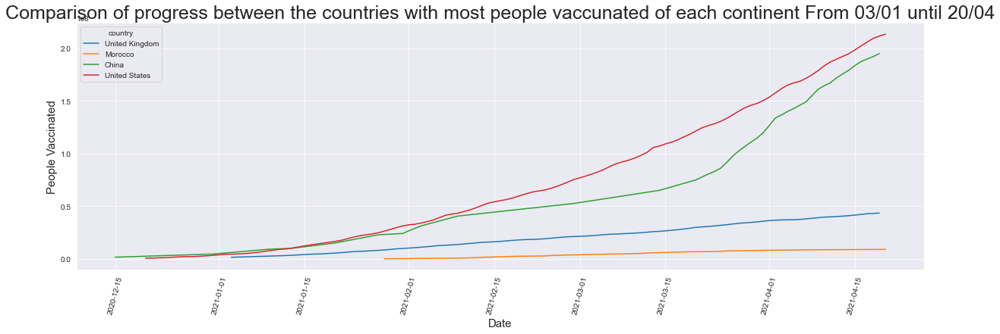

In [35]:
sns.set_style("darkgrid")
plt.figure(figsize=(20,6))
sns.lineplot(data= total_vaccination, x='date', y='total_vaccinations', hue = 'country', palette = 'tab10')
plt.xticks(rotation=75)
plt.title('Comparison of progress between the countries with most people vaccunated of each continent From 03/01 until 20/04',fontsize=25)
plt.xlabel('Date',fontsize=15)
plt.ylabel('People Vaccinated', fontsize=15)

#### Dos dosis

Además, también podemos estudiar en qué país está más avanzado el programa de vacunación. Para ello, tenemos que centrarnos en la variable **"people_fully_vaccinated_per_hundred"**. Esta varible refleja el ratio de la población totalmente inmunizada y la población total hasta la fecha en el país. Es importante tener en consideración este ratio porque no todos los países tienen la misma cantidad de población.


In [36]:
max_ = europe[europe['people_fully_vaccinated_per_hundred'] == np.max(europe['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]
max_1 = africa[africa['people_fully_vaccinated_per_hundred'] == np.max(africa['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]
max_2 = asia[asia['people_fully_vaccinated_per_hundred'] == np.max(asia['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]
max_3 = north_america[north_america['people_fully_vaccinated_per_hundred'] == np.max(north_america['people_fully_vaccinated_per_hundred'])][['country','people_fully_vaccinated_per_hundred']]

print(max_)
print(max_1)
print(max_2)
print(max_3)

            country  people_fully_vaccinated_per_hundred
iso_code                                                
GIB       Gibraltar                                91.45
             country  people_fully_vaccinated_per_hundred
iso_code                                                 
SYC       Seychelles                                51.38
         country  people_fully_vaccinated_per_hundred
iso_code                                             
ISR       Israel                                57.67
                 country  people_fully_vaccinated_per_hundred
iso_code                                                     
CYM       Cayman Islands                                43.72


In [37]:
res = europe.groupby("country")["people_fully_vaccinated_per_hundred"].agg(Numero_pacientes_vacunados="max")

vacc_Gibraltar = europe.loc[europe.country == 'Gibraltar']
vacc_Seychelles = africa.loc[africa.country == 'Seychelles']
vacc_Israel = asia.loc[asia.country == 'Israel']
vacc_Cayman = north_america.loc[north_america.country == 'Cayman Islands']
inmunized = pd.concat([vacc_Gibraltar, vacc_Seychelles, vacc_Israel, vacc_Cayman])

In [38]:
vacc_Cayman.index

Index(['CYM', 'CYM', 'CYM', 'CYM', 'CYM', 'CYM', 'CYM', 'CYM', 'CYM', 'CYM',
       ...
       'CYM', 'CYM', 'CYM', 'CYM', 'CYM', 'CYM', 'CYM', 'CYM', 'CYM', 'CYM'],
      dtype='object', name='iso_code', length=116)

Text(0, 0.5, '% People FULLY Vaccinated')

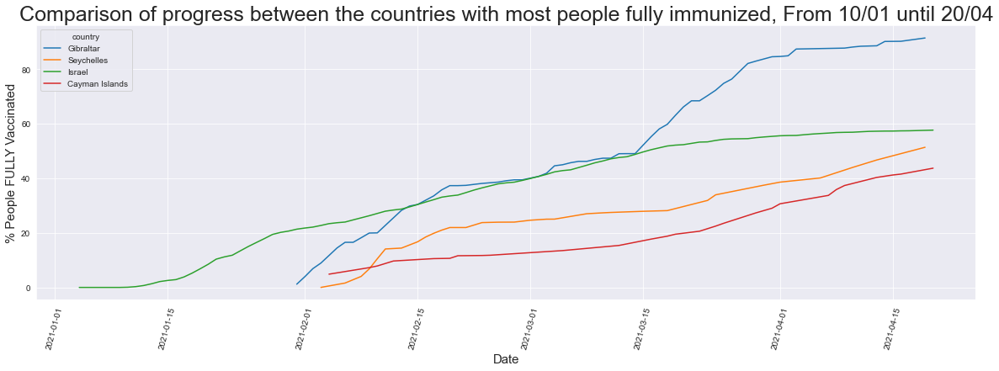

In [39]:
sns.set_style("darkgrid")
plt.figure(figsize=(20,6))
sns.lineplot(data= inmunized, x='date', y='people_fully_vaccinated_per_hundred', hue = 'country', palette = 'tab10')
plt.xticks(rotation=75)
plt.title('Comparison of progress between the countries with most people fully immunized, From 10/01 until 20/04',fontsize=25)
plt.xlabel('Date',fontsize=15)
plt.ylabel('% People FULLY Vaccinated', fontsize=15)

De este gráfico se pueden deducir varias cosas:

- El país que está más avanzado en su campaña de población es Gibraltar. Una de las razones principales a las que se debe esto, es que Gibraltar es un territorio pequeño (6,8 km^2) con una población de alrededor de 33000 personas. Se observa como alcanza la inmunidad de rebaño (70%) a mediados de marzo y continua subiendo. 

- Por otro lado, el segundo del mundo con mayor porcentaje de población totalmente inmunizada es Israel. Se aprecia como tiene un crecimiento bastante constante a medida que pasa el tiempo, hasta llegar a una estepa poco antes del 60%. **(El tramo verde en el que está todo a cero corresponde a diciembre de 2020 en el que no existía ninguna persona inmunizada, es un error de representación.**

- Las islas Caimán y las Seychelles comienzan su vacunación un poco más tarde, pero al ser también territorios con menos de 100000 personas, su ratio de inmunización es más elevado que otros territorios de su mismo continente. 

## Missing Data 

In [40]:
def fill_na(df,column):
    for c in column :
        df[column] = df[column].fillna(0)

In [41]:
covid_vaccine_data.columns

Index(['country', 'date', 'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website', 'Population'],
      dtype='object')

In [42]:
#columns to be filled with 0
cols = ['total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million','Population']

#filling NA values
fill_na(covid_vaccine_data,cols)

#check any NA values


In [43]:
covid_vaccine_data.isnull().sum()

country                                0
date                                   0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
daily_vaccinations                     0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
daily_vaccinations_per_million         0
vaccines                               0
source_name                            0
source_website                         0
Population                             0
dtype: int64

In [44]:
#covid_vaccine_data

In [46]:
covid_vaccine_data["Total_vaccinations(count)"]= covid_vaccine_data.groupby("country").total_vaccinations.tail(1)


In [48]:
#Top countries with most vaccinations
covid_vaccine_data.groupby("country")["Total_vaccinations(count)"].mean().sort_values(ascending= False).head(20)

country
United States     213388238.0
China             195022000.0
India             127129113.0
United Kingdom     43457910.0
England            36447797.0
Brazil             33807132.0
Germany            22935592.0
Turkey             20283227.0
France             17445832.0
Indonesia          17275001.0
Russia             16567842.0
Italy              15894532.0
Mexico             14368074.0
Chile              13352602.0
Spain              13041032.0
Canada             10481418.0
Israel             10354300.0
Poland              9210419.0
Morocco             8878445.0
Bangladesh          7423274.0
Name: Total_vaccinations(count), dtype: float64

/Users/gema/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 0, 'Total vaccinations(count)')

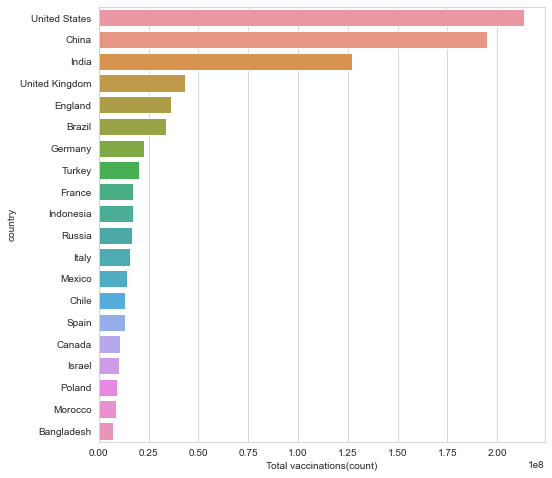

In [49]:
x= covid_vaccine_data.groupby("country")["Total_vaccinations(count)"].mean().sort_values(ascending= False).head(20)
sns.set_style("whitegrid")
plt.figure(figsize= (8,8))
ax= sns.barplot(x.values,x.index)
ax.set_xlabel("Total vaccinations(count)")

## Vacunas

In [45]:
vaccines_grp = covid_vaccine_data.vaccines.unique()

for v in vaccines_grp:
    countries_grp = covid_vaccine_data.loc[covid_vaccine_data.vaccines==v, 'country'].values
    print(f"Vaccines: {v}: \nCountries: {list(countries_grp)}\n")


Vaccines: Pfizer/BioNTech: 
Countries: ['Aruba', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Bermuda', 'Berm

Encontrar cuales son los países que más han utilizado un tipo de vacuna. 

In [50]:
#most common vaccines
covid_vaccine_data.vaccines.value_counts()

Moderna, Oxford/AstraZeneca, Pfizer/BioNTech                                          2764
Oxford/AstraZeneca                                                                    2253
Oxford/AstraZeneca, Pfizer/BioNTech                                                   1530
Pfizer/BioNTech                                                                       1313
Moderna, Pfizer/BioNTech                                                               527
Pfizer/BioNTech, Sinovac                                                               492
Sputnik V                                                                              435
Oxford/AstraZeneca, Sinovac                                                            357
Oxford/AstraZeneca, Sinopharm/Beijing                                                  328
Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac                                           298
Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sputnik V                      287

<AxesSubplot:xlabel='count', ylabel='vaccines'>

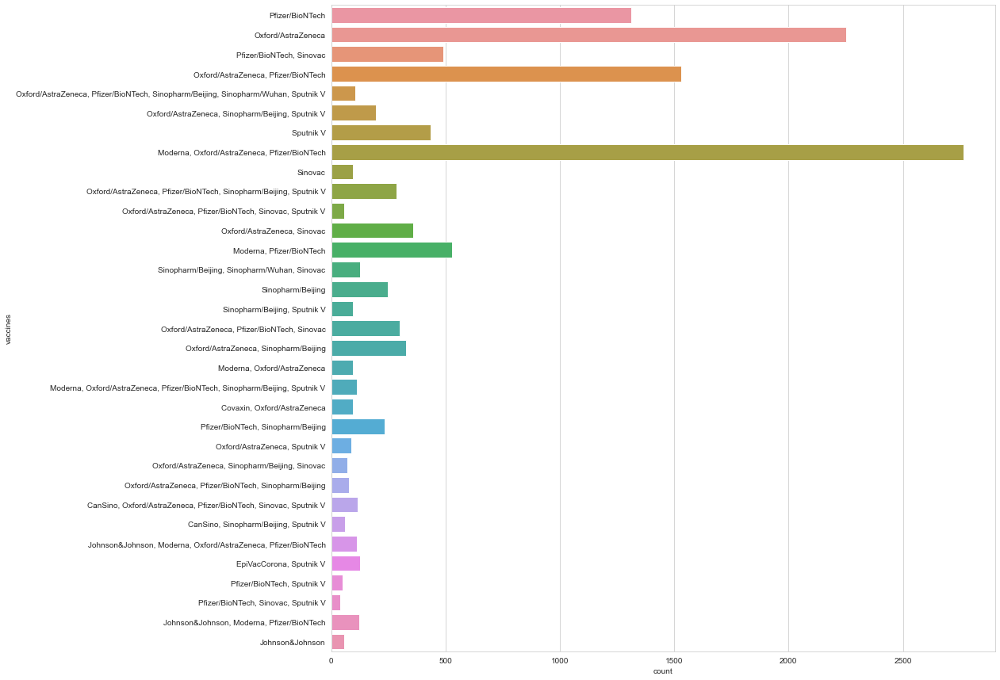

In [51]:
plt.figure(figsize=(15,15))
sns.countplot(y= "vaccines",data= covid_vaccine_data)